<a href="https://colab.research.google.com/github/FelipeNunesReis/Recomendacao-musicas-spotify/blob/main/recspotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importando dados**


*   Iniciando sessão do spark
*   Importando dados pelo drive
*   Carregando Dataset
*   Visualização e Análise Inicial dos Dados





In [ ]:
from pyspark.sql import SparkSession

In [ ]:
spark = SparkSession.builder\
                           .appName("Recomendador PySpark")\
                           .getOrCreate()
spark

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df=spark.read.csv("/content/drive/MyDrive/Alura/dados_musicas.csv", header= True, sep=";", inferSchema= True)

In [ ]:
df.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: integer (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- artists: string (nullable = true)
 |-- danceability: double (nullable = true)
 |-- duration_ms: integer (nullable = true)
 |-- energy: double (nullable = true)
 |-- explicit: integer (nullable = true)
 |-- id: string (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- key: integer (nullable = true)
 |-- liveness: double (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: integer (nullable = true)
 |-- name: string (nullable = true)
 |-- popularity: integer (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- artists_song: string (nullable = true)



In [ ]:
df.show()

+------------------+----+------------+--------------+------------------+-----------+------------------+--------+--------------------+--------------------+---+--------+-------------------+----+--------------------+----------+-----------+------------------+--------------------+
|           valence|year|acousticness|       artists|      danceability|duration_ms|            energy|explicit|                  id|    instrumentalness|key|liveness|           loudness|mode|                name|popularity|speechiness|             tempo|        artists_song|
+------------------+----+------------+--------------+------------------+-----------+------------------+--------+--------------------+--------------------+---+--------+-------------------+----+--------------------+----------+-----------+------------------+--------------------+
|             0.285|2000|     0.00239|      Coldplay|             0.429|     266773|0.6609999999999999|       0|3AJwUDP919kvQ9Qco...|             1.21E-4| 11|   0.234|  

In [ ]:
df.count()

20311

# **Pré processamento dos dados**



*   Verificação de dados nulos
*   Carregamento de novo dataset
*   Filtros





In [ ]:
import pyspark.sql.functions as f

In [ ]:
df.select([f.count(f.when(f.isnull(c),1)).alias(c) for c in df.columns]).show()

+-------+----+------------+-------+------------+-----------+------+--------+---+----------------+---+--------+--------+----+----+----------+-----------+-----+------------+
|valence|year|acousticness|artists|danceability|duration_ms|energy|explicit| id|instrumentalness|key|liveness|loudness|mode|name|popularity|speechiness|tempo|artists_song|
+-------+----+------------+-------+------------+-----------+------+--------+---+----------------+---+--------+--------+----+----+----------+-----------+-----+------------+
|      0|   0|           0|      0|           0|          0|     0|       0|  0|               0|  0|       0|       0|   0|   0|         0|          0|    0|           0|
+-------+----+------------+-------+------------+-----------+------+--------+---+----------------+---+--------+--------+----+----+----------+-----------+-----+------------+



In [ ]:
total_linhas = df.count()
df.show(n=total_linhas, truncate=False)

+------------------+----+---------------------+---------------------------------------------+------------------+-----------+--------------------+--------+----------------------+---------------------+---+------------------+-------------------+----+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------+------------------+------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|valence           |year|acousticness         |artists                                      |danceability      |duration_ms|energy              |explicit|id                    |instrumentalness     |key|liveness          |loudness           |mode|name                                       

In [ ]:
df_ano= spark.read.csv("/content/drive/MyDrive/Alura/dados_musicas_ano.csv", header= True, inferSchema= True)

In [ ]:
df_ano.show()

+----+----+------------------+-------------------+------------------+-------------------+-------------------+-------------------+-------------------+-------------------+------------------+-------------------+-------------------+---+
|mode|year|      acousticness|       danceability|       duration_ms|             energy|   instrumentalness|           liveness|           loudness|        speechiness|             tempo|            valence|         popularity|key|
+----+----+------------------+-------------------+------------------+-------------------+-------------------+-------------------+-------------------+-------------------+------------------+-------------------+-------------------+---+
|   1|1921|0.8868960000000005| 0.4185973333333336|260537.16666666663|0.23181513333333334|0.34487805886666656|            0.20571| -17.04866666666665|           0.073662|101.53149333333329|0.37932666666666665| 0.6533333333333333|  2|
|   1|1922|0.9385915492957748| 0.4820422535211267|165469.74647887325

In [ ]:
df_ano= df_ano.filter("year>=2000")
df_ano.show()

+----+----+-------------------+------------------+------------------+------------------+-------------------+-------------------+-------------------+-------------------+------------------+------------------+------------------+---+
|mode|year|       acousticness|      danceability|       duration_ms|            energy|   instrumentalness|           liveness|           loudness|        speechiness|             tempo|           valence|        popularity|key|
+----+----+-------------------+------------------+------------------+------------------+-------------------+-------------------+-------------------+-------------------+------------------+------------------+------------------+---+
|   1|2000|0.28932270051635994| 0.590918047034764| 242724.6426380368|0.6254128323108387|0.10116776879345596| 0.1976860429447853| -8.247765848670758|0.08920541922290394| 118.9993231083843|0.5594754601226991|  46.6840490797546|  7|
|   1|2001| 0.2868424748428934|0.5833178553615969|240307.79600997505|0.626985522

# **Visualizações gráficas**



*   Analise de variação em graficos de linhas (utilização plotly.express e plotly.graph_objects)
*   Analise de correlação com grafico heatmap (utilização do imshow)
*   Carregado o dados do genêro músical




In [ ]:
import plotly.express as px

fig= px.line(df_ano.toPandas(), x="year", y="acousticness",markers=True, title="Variação de musica acústica conforme os anos")
fig.show()

In [ ]:
import plotly.graph_objects as go

fig=go.Figure()

temp=df_ano.toPandas()

fig.add_trace(go.Scatter(x=temp["year"],y=temp["acousticness"], name="Acousticness"))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['valence'],
                    name='Valence'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['danceability'],
                    name='Danceability'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['energy'],
                    name='Energy'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['instrumentalness'],
                    name='Instrumentalness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['liveness'],
                    name='Liveness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['speechiness'],
                    name='Speechiness'))

fig.show()

In [ ]:
fig= px.imshow(df_ano.drop('mode').toPandas().corr(), text_auto=True
               , title="Correlação entre as variáveis")

fig.update_layout(
    title={
        'text': "Correlação entre as variáveis",
        'y':0.9,
        'x':0.48,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [ ]:
df_genero=spark.read.csv("/content/drive/MyDrive/Alura/dados_musicas_genero.csv", header=True, inferSchema=True)

In [ ]:
df_genero.show()

+----+--------------------+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+
|mode|              genres|       acousticness|       danceability|       duration_ms|             energy|    instrumentalness|           liveness|           loudness|         speechiness|             tempo|            valence|        popularity|key|
+----+--------------------+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+
|   1|21st century clas...| 0.9793333333333332|0.16288333333333335|160297.66666666663|0.07131666666666665|          0.60683367|             0.3616|-31.514333333333337| 0.04056666666666667|           75.3365|0.10378333333333334| 27.83333333333333| 

In [ ]:
df_genero.select("genres").distinct().count()

2973

# **Preparação dos Dados com VectorAssembler, StandardScaler e PCA**



* **VectorAssembler**

Foi utilizado para combinar múltiplos atributos numéricos (como danceability, energy, acousticness, tempo, etc.) em uma única coluna de vetores chamada "features". Isso é necessário para que os modelos de ML do Spark possam operar sobre os dados.

* **StandardScaler**

Como os atributos possuem escalas diferentes (por exemplo, tempo varia em BPM, enquanto valence vai de 0 a 1), foi aplicada uma normalização dos dados. Isso impede que atributos com escalas maiores dominem os cálculos de distância.


* **PCA (Análise de Componentes Principais)**

Após a normalização, foi aplicado o PCA para reduzir a dimensionalidade dos dados vetoriais. Essa técnica mantém os componentes mais relevantes e facilita o cálculo de similaridade, tornando o modelo mais leve e eficiente, além de reduzir ruído nos dados.





In [ ]:
from pyspark.ml.feature import VectorAssembler, PCA, StandardScaler

In [ ]:
df_genero.columns

['mode',
 'genres',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'popularity',
 'key']

In [ ]:
X=df_genero.columns
X.remove("genres")
X

['mode',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'popularity',
 'key']

In [ ]:
df_genero_vector= VectorAssembler(inputCols=X, outputCol="features").transform(df_genero).select(["features", "genres"])

In [ ]:
df_genero_vector.show(truncate=False, n=5)

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------------------+
|features                                                                                                                                                                                                                   |genres                |
+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------------------+
|[1.0,0.9793333333333332,0.16288333333333335,160297.66666666663,0.07131666666666665,0.60683367,0.3616,-31.514333333333337,0.04056666666666667,75.3365,0.10378333333333334,27.83333333333333,6.0]                            |21st century classical|
|[1.0,0.49478,0.2993

In [ ]:
scaler= StandardScaler(inputCol="features", outputCol="scaled_features")
scaler_model= scaler.fit(df_genero_vector)
df_genero_scaled=scaler_model.transform(df_genero_vector)

In [ ]:
df_genero_scaled.show(
)

+--------------------+--------------------+--------------------+
|            features|              genres|     scaled_features|
+--------------------+--------------------+--------------------+
|[1.0,0.9793333333...|21st century clas...|[2.68174831000279...|
|[1.0,0.49478,0.29...|               432hz|[2.68174831000279...|
|[1.0,0.762,0.7120...|               8-bit|[2.68174831000279...|
|[1.0,0.6514170195...|                  []|[2.68174831000279...|
|[1.0,0.6765573049...|          a cappella|[2.68174831000279...|
|[1.0,0.45921,0.51...|            abstract|[2.68174831000279...|
|[1.0,0.3421466666...|      abstract beats|[2.68174831000279...|
|[1.0,0.2438540633...|    abstract hip hop|[2.68174831000279...|
|[0.0,0.3229999999...|           accordeon|[0.0,1.0101313736...|
|[1.0,0.446125,0.6...|           accordion|[2.68174831000279...|
|[0.0,0.0679505384...|          acid house|[0.0,0.2125045534...|
|[1.0,0.2569145079...|           acid rock|[2.68174831000279...|
|[1.0,0.00683,0.66...|   

In [ ]:
pca= PCA(k=2, inputCol="scaled_features", outputCol="pca_features")
model_pca=pca.fit(df_genero_scaled)
df_genero_pca=model_pca.transform(df_genero_scaled)

df_genero_pca.show()

+--------------------+--------------------+--------------------+--------------------+
|            features|              genres|     scaled_features|        pca_features|
+--------------------+--------------------+--------------------+--------------------+
|[1.0,0.9793333333...|21st century clas...|[2.68174831000279...|[-2.5070953668885...|
|[1.0,0.49478,0.29...|               432hz|[2.68174831000279...|[0.59696790566334...|
|[1.0,0.762,0.7120...|               8-bit|[2.68174831000279...|[4.15846027622355...|
|[1.0,0.6514170195...|                  []|[2.68174831000279...|[2.38734487851221...|
|[1.0,0.6765573049...|          a cappella|[2.68174831000279...|[2.65012183716790...|
|[1.0,0.45921,0.51...|            abstract|[2.68174831000279...|[1.49650912033676...|
|[1.0,0.3421466666...|      abstract beats|[2.68174831000279...|[3.92352077215732...|
|[1.0,0.2438540633...|    abstract hip hop|[2.68174831000279...|[4.61101110983111...|
|[0.0,0.3229999999...|           accordeon|[0.0,1.0101

In [ ]:
from pyspark.ml import Pipeline

In [ ]:
pca_pipeline= Pipeline(stages=[VectorAssembler(inputCols=X, outputCol="features"),
                               StandardScaler(inputCol="features", outputCol="scaled_features"),
                               PCA(k=2, inputCol="scaled_features", outputCol="pca_features")])

In [ ]:
pca_pipeline_model=pca_pipeline.fit(df_genero)
df_genero_pca=pca_pipeline_model.transform(df_genero)
df_genero_pca.show()

+----+--------------------+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+--------------------+--------------------+--------------------+
|mode|              genres|       acousticness|       danceability|       duration_ms|             energy|    instrumentalness|           liveness|           loudness|         speechiness|             tempo|            valence|        popularity|key|            features|     scaled_features|        pca_features|
+----+--------------------+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+--------------------+--------------------+--------------------+
|   1|21st century clas...| 0.9793333333333332|0.162883333

In [ ]:
from pyspark.ml.clustering import KMeans

kmeans= KMeans(k=5, featuresCol="pca_features", predictionCol="cluster").setK(5).setSeed(42)
kmeans_model=kmeans.fit(df_genero_pca)

In [ ]:
prections_kmeans = kmeans_model.transform(df_genero_pca)

prections_kmeans.select("pca_features", "cluster").show(truncate=False)

+------------------------------------------+-------+
|pca_features                              |cluster|
+------------------------------------------+-------+
|[-2.5070953668885663,-0.43816913737698293]|1      |
|[0.596967905663348,-4.981612052751353]    |1      |
|[4.158460276223559,0.83665250810799]      |0      |
|[2.3873448785122156,0.4877989015663361]   |4      |
|[2.650121837167907,0.575681976882043]     |4      |
|[1.4965091203367622,-1.8644183183717828]  |1      |
|[3.9235207721573224,-0.28518350023528705] |0      |
|[4.611011109831113,0.6783790472312338]    |0      |
|[2.8376900630842288,0.57129937165805]     |0      |
|[2.706690139892782,1.2593788079708255]    |4      |
|[4.698331383924286,-1.2765569680619455]   |2      |
|[3.375987496679866,-0.7560741064307498]   |0      |
|[5.608998877066019,-1.042731164439324]    |3      |
|[-0.2954946352117699,0.2763864586236268]  |1      |
|[2.572559106287041,1.3169815431109746]    |4      |
|[3.400822802049343,-0.5073029625781936]   |0 

In [ ]:
from pyspark.ml.functions import vector_to_array

pca_features_xy=prections_kmeans.withColumn("x", vector_to_array("pca_features")[0])\
                .withColumn("y",vector_to_array("pca_features")[1])\
                .select(["x","y","cluster","genres"])

In [ ]:
pca_features_xy.show()

+-------------------+--------------------+-------+--------------------+
|                  x|                   y|cluster|              genres|
+-------------------+--------------------+-------+--------------------+
|-2.5070953668885663|-0.43816913737698293|      1|21st century clas...|
|  0.596967905663348|  -4.981612052751353|      1|               432hz|
|  4.158460276223559|    0.83665250810799|      0|               8-bit|
| 2.3873448785122156|  0.4877989015663361|      4|                  []|
|  2.650121837167907|   0.575681976882043|      4|          a cappella|
| 1.4965091203367622| -1.8644183183717828|      1|            abstract|
| 3.9235207721573224|-0.28518350023528705|      0|      abstract beats|
|  4.611011109831113|  0.6783790472312338|      0|    abstract hip hop|
| 2.8376900630842288|    0.57129937165805|      0|           accordeon|
|  2.706690139892782|  1.2593788079708255|      4|           accordion|
|  4.698331383924286| -1.2765569680619455|      2|          acid

# **Visualização Interativa com Plotly**
Este trecho de código cria um gráfico de dispersão interativo (scatter plot) para visualizar os dados de músicas projetados em duas dimensões (eixo X e Y), após a aplicação de PCA para redução de dimensionalidade.

In [ ]:
fig= px.scatter(pca_features_xy.toPandas(), x="x",y="y", color= "cluster", symbol="genres", hover_data=["x","y","genres"])
fig.update_layout(
    legend=dict(
        orientation="v",
        yanchor="auto",
        y=1,
        xanchor="left",
        x=0
    )
)

fig.show()

In [ ]:
pca_pipeline_model.stages[2].explainedVariance

DenseVector([0.2975, 0.1212])

In [ ]:
df.show()

+------------------+----+------------+--------------+------------------+-----------+------------------+--------+--------------------+--------------------+---+--------+-------------------+----+--------------------+----------+-----------+------------------+--------------------+
|           valence|year|acousticness|       artists|      danceability|duration_ms|            energy|explicit|                  id|    instrumentalness|key|liveness|           loudness|mode|                name|popularity|speechiness|             tempo|        artists_song|
+------------------+----+------------+--------------+------------------+-----------+------------------+--------+--------------------+--------------------+---+--------+-------------------+----+--------------------+----------+-----------+------------------+--------------------+
|             0.285|2000|     0.00239|      Coldplay|             0.429|     266773|0.6609999999999999|       0|3AJwUDP919kvQ9Qco...|             1.21E-4| 11|   0.234|  

In [ ]:
X=df.columns
X.remove("artists")
X.remove("id")
X.remove("name")
X.remove("artists_song")
X

['valence',
 'year',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'explicit',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'popularity',
 'speechiness',
 'tempo']

In [ ]:
df_enc_vector= VectorAssembler(inputCols=X, outputCol= "features").transform(df)

df_enc_vector.select("features").show(truncate=False, n=5)

+-------------------------------------------------------------------------------------------------------------------------+
|features                                                                                                                 |
+-------------------------------------------------------------------------------------------------------------------------+
|[0.285,2000.0,0.00239,0.429,266773.0,0.6609999999999999,0.0,1.21E-4,11.0,0.234,-7.227,1.0,84.0,0.0281,173.372]           |
|[0.613,2000.0,0.143,0.843,270507.0,0.8059999999999999,1.0,0.0,4.0,0.0771,-5.9460000000000015,0.0,80.0,0.269,94.948]      |
|[0.4,2000.0,0.00958,0.556,216880.0,0.8640000000000001,0.0,0.0,3.0,0.209,-5.87,0.0,84.0,0.0584,105.143]                   |
|[0.5429999999999999,2000.0,0.00664,0.545,233933.0,0.865,0.0,1.1E-5,11.0,0.168,-5.7079999999999975,0.0,78.0,0.0286,99.009]|
|[0.76,2000.0,0.0302,0.949,284200.0,0.6609999999999999,1.0,0.0,5.0,0.0454,-4.244,0.0,80.0,0.0572,104.504]                 |
+-------

In [ ]:
scaler= StandardScaler(inputCol="features", outputCol="features_scaled")
model_scaler= scaler.fit(df_enc_vector)
df_musica_scaler=model_scaler.transform(df_enc_vector)

In [ ]:
df_musica_scaler.select("features_scaled").show(truncate= False,n=5)

+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|features_scaled                                                                                                                                                                                                                                                               |
+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|[1.156596679221045,329.8170613984441,0.008403188822334736,2.5040545743834373,3.7858811737298526,2.980511298201045,0.0,6.070790766862789E-4,3.0696424994844875,1.4832857988766257,-1.

In [ ]:
k = len(X)
k

15

In [ ]:
pca=PCA(k=k,inputCol="features_scaled", outputCol="pca_features")
model_pca=pca.fit(df_musica_scaler)
df_musica_pca=model_pca.transform(df_musica_scaler)

In [ ]:
sum(model_pca.explainedVariance)*100

np.float64(100.00000000000003)

In [ ]:
lista_valores=[sum(model_pca.explainedVariance[0:i+1])for i in range(k)]
lista_valores

[np.float64(0.21297354127107349),
 np.float64(0.3459774162295507),
 np.float64(0.43989805678254446),
 np.float64(0.5267820578269103),
 np.float64(0.6001038103117929),
 np.float64(0.666571951365239),
 np.float64(0.7282174213581728),
 np.float64(0.7845103843321023),
 np.float64(0.8350002357002614),
 np.float64(0.8812446547406769),
 np.float64(0.9151737562703048),
 np.float64(0.9435370133056039),
 np.float64(0.9699018569070161),
 np.float64(0.9900947792885582),
 np.float64(1.0000000000000002)]

In [ ]:
import numpy as np

k=sum(np.array(lista_valores)<=0.7)
k

np.int64(6)

In [ ]:
pca=PCA(k=k,inputCol="features_scaled", outputCol="pca_features")
model_pca=pca.fit(df_musica_scaler)
df_musica_pca_final=model_pca.transform(df_musica_scaler)

In [ ]:
df_musica_pca_final.select("pca_features").show(truncate=False, n=5)

+----------------------------------------------------------------------------------------------------------------------+
|pca_features                                                                                                          |
+----------------------------------------------------------------------------------------------------------------------+
|[-34.71004464775702,-165.3684878490617,-11.163498729833675,-139.1137428085442,14.152192300931317,-6.254422223810444]  |
|[-36.49885762774904,-167.85185045616547,-10.729023248907904,-135.90435265671286,13.38840189058717,-3.972980727830917] |
|[-35.46030091694054,-165.99633344577876,-11.361290348241944,-138.24276881246985,13.866654919305718,-4.342675920458773]|
|[-35.56301325520582,-165.59515096480598,-11.46022600703173,-137.52095740570027,15.568542803922659,-4.542073725584329] |
|[-36.54556974907565,-167.37512505802474,-11.881276527236897,-136.27798590243967,14.056847990344485,-3.583390145779214]|
+-------------------------------

In [ ]:
sum(model_pca.explainedVariance)*100

np.float64(66.6571951365239)

# **Esse pipeline tem como objetivo automatizar o pré-processamento dos dados para:**

*   Reduzir complexidade dos dados,

*   Melhorar performance nos cálculos de similaridade,

*   E visualizar os dados em 2D ou 3D, por exemplo, com k = 2 ou k = 3




In [ ]:
pca_pipeline=Pipeline(stages=[VectorAssembler(inputCols=X, outputCol= "features"),
                              StandardScaler(inputCol="features", outputCol="features_scaled"),
                              PCA(k=k,inputCol="features_scaled", outputCol="pca_features")

])

# **Etapas de transformção e treino dos dados**



*   Utilização do pca para ajuste de pipeline e transformação dos dados
*   Utilização do Kmeans para realização de clustering



In [ ]:
model_pca_pipeline=pca_pipeline.fit(df)
projection= model_pca_pipeline.transform(df)

In [ ]:
modelo_kmeans= kmeans.fit(projection)
projection_kmeans= modelo_kmeans.transform(projection)

projection_kmeans.select(["pca_features", "cluster"]).show()

+--------------------+-------+
|        pca_features|cluster|
+--------------------+-------+
|[-34.710044647757...|      0|
|[-36.498857627749...|      4|
|[-35.460300916940...|      0|
|[-35.563013255205...|      1|
|[-36.545569749075...|      4|
|[-36.713222290262...|      1|
|[-36.013246178822...|      1|
|[-36.542687712104...|      4|
|[-36.425249009784...|      1|
|[-35.872074915770...|      1|
|[-31.639065936568...|      2|
|[-35.661446890546...|      1|
|[-35.574542234850...|      1|
|[-36.022399748656...|      4|
|[-34.336941950985...|      0|
|[-35.096906055142...|      1|
|[-35.202423054032...|      0|
|[-34.942948671026...|      0|
|[-36.617404517517...|      4|
|[-34.296973387410...|      1|
+--------------------+-------+
only showing top 20 rows



In [ ]:
projection_kmeans=projection_kmeans.withColumn("x",vector_to_array("pca_features")[0])\
                                   .withColumn("y",vector_to_array("pca_features")[1])
projection_kmeans.select(["x","y","cluster","artists_song"]).show(truncate=False)

+-------------------+-------------------+-------+--------------------------------------------------------+
|x                  |y                  |cluster|artists_song                                            |
+-------------------+-------------------+-------+--------------------------------------------------------+
|-34.71004464775702 |-165.3684878490617 |0      |Coldplay - Yellow                                       |
|-36.49885762774904 |-167.85185045616547|4      |OutKast - Ms. Jackson                                   |
|-35.46030091694054 |-165.99633344577876|0      |Linkin Park - In the End                                |
|-35.56301325520582 |-165.59515096480598|1      |3 Doors Down - Kryptonite                               |
|-36.54556974907565 |-167.37512505802474|4      |Eminem - The Real Slim Shady                            |
|-36.7132222902623  |-166.482084830997  |1      |Disturbed - Down with the Sickness                      |
|-36.01324617882219 |-166.63514920955

In [ ]:
fig=px.scatter(projection_kmeans.toPandas(),x="x",y="y",color="cluster", hover_data=["artists_song"])
fig.show()

# **Recomendação por Cluster**
Este trecho implementa a lógica de recomendação baseada em clusters, onde músicas são recomendadas ao usuário com base no grupo (cluster) ao qual pertence a música que ele selecionou.


1.   **Entrada do Usuário**:

  O usuário digita o nome (ou o identificador) da música que deseja usar como referência para recomendação.
2.   Filtro do Cluster da Música Escolhida:
* Filtra o DataFrame projection_kmeans (que já contém os rótulos de cluster).
* Busca a linha correspondente à música digitada.
*  Seleciona apenas a coluna "cluster" e coleta o resultado em uma lista (collect() converte para Python).
3.   **Verificação e Captura do Cluster**:
* Se a música for encontrada, captura o valor do cluster (cluster_musica) e exibe o número do cluster.
* Caso contrário, informa que a música não foi encontrada.
4.  **Recomendação: Filtrar Músicas no Mesmo Cluster**
* Filtra todas as músicas que pertencem ao mesmo cluster da música de entrada.
* Seleciona as colunas:
  
  "artists_song": nome e artista da música,

  "id": ID da música (útil para consulta na API, por exemplo),

  "pca_features": vetores reduzidos (podem ser usados para visualização ou cálculo de distância adicional).
5. **Exibição das Recomendações**

In [ ]:
nome_musica = input("")

Linkin Park - Crawling


In [ ]:
filtered_df = projection_kmeans.filter(projection_kmeans.artists_song == nome_musica).select("cluster").collect()

if filtered_df:
    cluster_musica = filtered_df[0][0]
    print(f"Cluster for '{nome_musica}': {cluster_musica}")
else:
    print(f"Música '{nome_musica}' não encontrada no DataFrame.")

Cluster for 'Linkin Park - Crawling': 0


In [ ]:
musicas_recomendadas=projection_kmeans.filter(projection_kmeans.cluster==cluster_musica)\
                                      .select("artists_song","id","pca_features")
musicas_recomendadas.show()

+--------------------+--------------------+--------------------+
|        artists_song|                  id|        pca_features|
+--------------------+--------------------+--------------------+
|   Coldplay - Yellow|3AJwUDP919kvQ9Qco...|[-34.710044647757...|
|Linkin Park - In ...|60a0Rd6pjrkxjPbaK...|[-35.460300916940...|
|The Beatles - Hey...|0aym2LBJBk9DAYuHH...|[-34.336941950985...|
|Lifehouse - Hangi...|0wqOReZDnrefefEsr...|[-35.202423054032...|
|Linkin Park - Cra...|57BrRMwf9LrcmuOsy...|[-34.942948671026...|
|Deftones - Change...|51c94ac31swyDQj9B...|[-34.822854780680...|
|Linkin Park - Pap...|1Vej0qeQ3ioKwpI6F...|[-36.424527735228...|
|  U2 - Beautiful Day|1VuBmEauSZywQVtqb...|[-35.349458484689...|
|    Godsmack - Awake|6xXlurslWqFuyqTCB...|[-35.426263899595...|
|Christina Aguiler...|32h59T8q2SonUPJ00...|[-35.443261691509...|
|A Perfect Circle ...|5KDNFlHAdDJ84fhK2...|[-35.209719136146...|
|Limp Bizkit - My Way|2gSVKxPDww9Eep5rd...|[-36.284940371311...|
|*NSYNC - This I P...|46n

In [ ]:
componentes_musicas=musicas_recomendadas.filter(musicas_recomendadas.artists_song ==nome_musica)\
                                        .select("pca_features").collect()[0][0]
componentes_musicas

DenseVector([-34.9429, -165.3581, -11.2629, -137.8873, 12.3106, -4.804])

In [ ]:
from scipy.spatial.distance import euclidean
from pyspark.sql.types import FloatType

# **Essa função faz uma recomendação personalizada de músicas baseando-se em:**

*  O cluster ao qual a música pertence (agrupamento via KMeans),

*  A distância vetorial entre a música escolhida e as demais músicas do mesmo cluster (com vetores PCA),

*  A proximidade musical real, retornando as 10 músicas mais próximas.



In [ ]:
def calcula_distance(value):
  return euclidean(componentes_musicas, value)

udf_calcula_distance=f.udf(calcula_distance,FloatType())

musicas_recomendadas_dist=musicas_recomendadas.withColumn("Dist",udf_calcula_distance("pca_features"))


recomendadas=spark.createDataFrame(musicas_recomendadas_dist.sort("Dist").take(10)).select(['artists_song',"id","Dist"])
recomendadas.show()

+--------------------+--------------------+------------------+
|        artists_song|                  id|              Dist|
+--------------------+--------------------+------------------+
|Linkin Park - Cra...|57BrRMwf9LrcmuOsy...|               0.0|
|Evanescence - Swe...|7hlXiMxN81uctLsvb...|0.4638749659061432|
|Journey - Don't S...|77NNZQSqzLNqh2A9J...|0.5009961724281311|
|Mother Mother - O...|5dn0Sn7oEwq5Q3Hg5...|0.5752463936805725|
|Waka Flocka Flame...|70Wb2xKOAOte8iNkB...|0.6106874346733093|
|Daft Punk - One M...|0DiWol3AO6WpXZgp0...|0.6262887120246887|
|Mario - Crying Ou...|3lMgczyYCjVDpJX8W...|0.6630286574363708|
|Kenny Chesney - T...|1Lh8n5owE0h0hgqWf...|0.6789183616638184|
| Saint Motel - Butch|5ZQWNRoJsfkByZFHq...|0.6796292662620544|
|Chevelle - Vitami...|04NGX0b5Tgs7VsErf...|0.6809139251708984|
+--------------------+--------------------+------------------+



In [ ]:
def recomendador(nome_musica):
  cluster = projection_kmeans.filter(projection_kmeans.artists_song == nome_musica).select('cluster').collect()[0][0]
  musicas_recomendadas = projection_kmeans.filter(projection_kmeans.cluster == cluster_musica)\
                                       .select('artists_song', 'id', 'pca_features')
  componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]

  def calcula_distance(value):
    return euclidean(componenetes_musica, value)

  udf_calcula_distance = f.udf(calcula_distance, FloatType())

  musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distance('pca_features'))

  recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10)).select(['artists_song', 'id', 'Dist'])

  recomendadas.select('artists_song').show(truncate=False)

In [ ]:
recomendador("Linkin Park - Crawling")

+---------------------------------------------------------+
|artists_song                                             |
+---------------------------------------------------------+
|Linkin Park - Crawling                                   |
|Evanescence - Sweet Sacrifice                            |
|Journey - Don't Stop Believin'                           |
|Mother Mother - Oleander                                 |
|Waka Flocka Flame - No Hands (feat. Roscoe Dash and Wale)|
|Daft Punk - One More Time                                |
|Mario - Crying Out For Me                                |
|Kenny Chesney - Til It's Gone                            |
|Saint Motel - Butch                                      |
|Chevelle - Vitamin R (Leading Us Along)                  |
+---------------------------------------------------------+



In [ ]:
!pip install spotipy

# **Integração com a API do Spotify**
Usei a biblioteca spotipy, uma interface Python bem popular para interagir com os dados do Spotify (músicas, álbuns, playlists, artistas etc.).



In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth,SpotifyClientCredentials

In [ ]:
scope="user-library-read playlist-modify-private"
OAuth=SpotifyOAuth(
    scope=scope,
    redirect_uri='http://localhost:5000/callback',
    client_id="3210bb00ce90417daeae49d278601f93",
    client_secret="e85d12d47cf9451f9cdf6272cde1b2cd"

)

In [ ]:
client_credentials_manager=SpotifyClientCredentials(client_id="3210bb00ce90417daeae49d278601f93",
                                                   client_secret="e85d12d47cf9451f9cdf6272cde1b2cd")
sp=spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [ ]:
id= projection_kmeans.filter(projection_kmeans.artists_song==nome_musica).select("id").collect()[0][0]
id

'57BrRMwf9LrcmuOsyGilwr'

In [ ]:
sp.track(id)

{'album': {'album_type': 'album',
  'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/6XyY86QOPPrYVGvF9ch6wz'},
    'href': 'https://api.spotify.com/v1/artists/6XyY86QOPPrYVGvF9ch6wz',
    'id': '6XyY86QOPPrYVGvF9ch6wz',
    'name': 'Linkin Park',
    'type': 'artist',
    'uri': 'spotify:artist:6XyY86QOPPrYVGvF9ch6wz'}],
  'available_markets': ['AR',
   'AU',
   'AT',
   'BE',
   'BO',
   'BR',
   'BG',
   'CL',
   'CO',
   'CR',
   'CY',
   'CZ',
   'DK',
   'DO',
   'DE',
   'EC',
   'EE',
   'SV',
   'FI',
   'FR',
   'GR',
   'GT',
   'HN',
   'HK',
   'HU',
   'IS',
   'IE',
   'IT',
   'LV',
   'LT',
   'LU',
   'MY',
   'MT',
   'MX',
   'NL',
   'NZ',
   'NI',
   'NO',
   'PA',
   'PY',
   'PE',
   'PH',
   'PL',
   'PT',
   'SG',
   'SK',
   'ES',
   'SE',
   'CH',
   'TW',
   'TR',
   'UY',
   'US',
   'GB',
   'AD',
   'LI',
   'MC',
   'ID',
   'JP',
   'TH',
   'VN',
   'RO',
   'IL',
   'ZA',
   'SA',
   'AE',
   'BH',
   'QA',
   'OM',
   'KW',


# **Recomendador com Cluster + PCA + Distância + Integração com Spotify**

**Essa função:**

* Identifica músicas semelhantes com base em agrupamento KMeans.

* Ordena pela distância vetorial (PCA).

* Exibe recomendações personalizadas.

* E extrai os IDs das músicas para uso posterior em API (como criação de playlists no Spotify).

In [ ]:
def recomendador(nome_musica):
  # Calcula musicas recomendadas
  # Calculate the cluster for the input song
  try:
      cluster_musica = projection_kmeans.filter(projection_kmeans.artists_song == nome_musica).select('cluster').collect()[0][0]
  except IndexError:
      print(f"Música '{nome_musica}' não encontrada no DataFrame.")
      return


  musicas_recomendadas = projection_kmeans.filter(projection_kmeans.cluster == cluster_musica)\
                                       .select('artists_song', 'id', 'pca_features')


  try:
      componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]
  except IndexError:

       print(f"Música '{nome_musica}' não encontrada no cluster {cluster_musica}.")
       return


  def calcula_distance(value):
    return euclidean(componenetes_musica, value)

  udf_calcula_distance = f.udf(calcula_distance, FloatType())

  musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distance('pca_features'))

  recomendadas_pd = musicas_recomendadas_dist.sort('Dist').limit(15).toPandas()

  print("Músicas Recomendadas:")
  print(recomendadas_pd[['artists_song', 'Dist']])


  playlist_id = recomendadas_pd['id'].tolist()


In [ ]:
recomendador("Linkin Park - Crawling")

Músicas Recomendadas:
                                         artists_song      Dist
0                              Linkin Park - Crawling  0.000000
1                       Evanescence - Sweet Sacrifice  0.463875
2                      Journey - Don't Stop Believin'  0.500996
3                            Mother Mother - Oleander  0.575246
4   Waka Flocka Flame - No Hands (feat. Roscoe Das...  0.610687
5                           Daft Punk - One More Time  0.626289
6                           Mario - Crying Out For Me  0.663029
7                       Kenny Chesney - Til It's Gone  0.678918
8                                 Saint Motel - Butch  0.679629
9             Chevelle - Vitamin R (Leading Us Along)  0.680914
10                                   MGMT - The Youth  0.709442
11  Fall Out Boy - The Patron Saint of Liars and F...  0.724441
12                      Michael Jackson - Dirty Diana  0.725040
13               My Chemical Romance - Under Pressure  0.729016
14                

# **Exibição da Capa do Álbum da Música Escolhida**

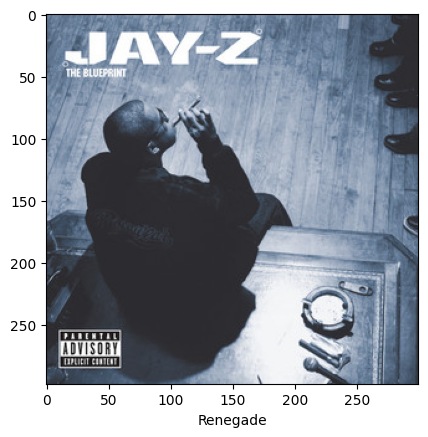

In [ ]:
import matplotlib.pyplot as plt
from skimage import io

id = projection_kmeans\
          .filter(projection_kmeans.artists_song == nome_musica)\
          .select('id').collect()[0][0]

track = sp.track(id)

url = track["album"]["images"][1]["url"]
name = track["name"]

image = io.imread(url)
plt.imshow(image)
plt.xlabel(name, fontsize = 10)
plt.show()

In [ ]:
def visualize_songs(name,url):

    plt.figure(figsize=(10,8))
    columns = 5
    for i, u in enumerate(url):
        ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
        image = io.imread(u)
        plt.imshow(image)
        ax.get_yaxis().set_visible(False)
        plt.xticks(color = 'w', fontsize = 0.1)
        plt.yticks(color = 'w', fontsize = 0.1)
        plt.xlabel(name[i], fontsize = 10)
        plt.tight_layout(h_pad=0.7, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.grid(visible=None)
        #plt.axis('off')
    plt.show()

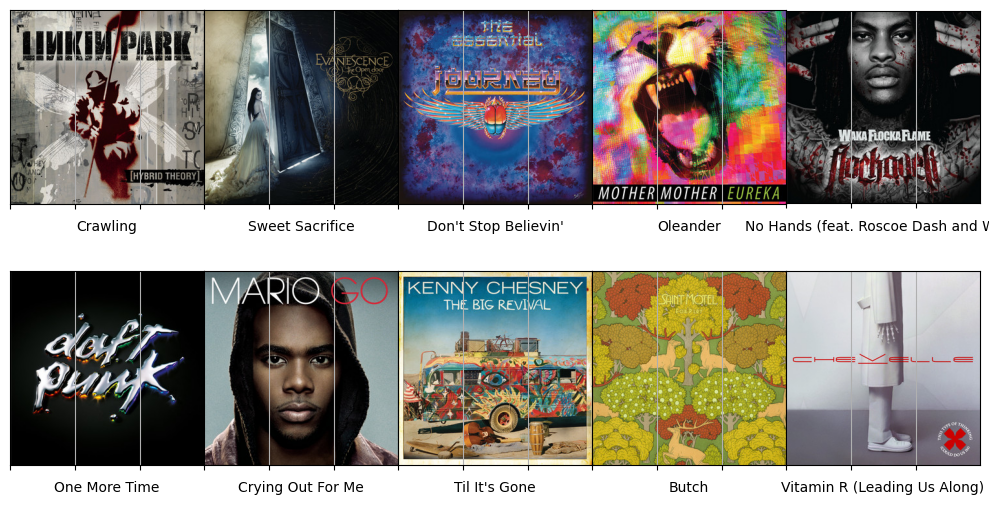

In [ ]:
playlist_id = recomendadas.select('id').collect()

name = []
url = []
for i in playlist_id:
    track = sp.track(i[0])
    url.append(track["album"]["images"][1]["url"])
    name.append(track["name"])

visualize_songs(name, url)

# **Sistema de Recomendação de Músicas com Visualização de Capas**
***Foi usado Spotipy + PySpark + PCA + Distância Euclidiana + KMeans)***


**Essa função:**

* Filtra músicas semelhantes com base em clusterização.

* Rankeia por distância vetorial (PCA).

* Consulta a API do Spotify para obter capas de álbuns.

* Exibe essas capas graficamente usando Matplotlib.

In [ ]:
def recomendador(nome_musica):

  try:
      cluster = projection_kmeans.filter(projection_kmeans.artists_song == nome_musica).select('cluster').collect()[0][0]
  except IndexError:
      print(f"Música '{nome_musica}' não encontrada no DataFrame.")
      return

  musicas_recomendadas = projection_kmeans.filter(projection_kmeans.cluster == cluster)\
                                       .select('artists_song', 'id', 'pca_features')

  try:
      componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]
  except IndexError:
       print(f"Música '{nome_musica}' não encontrada no cluster {cluster}.")
       return


  def calcula_distance(value):
    return euclidean(componenetes_musica, value)

  udf_calcula_distance = f.udf(calcula_distance, FloatType())

  musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distance('pca_features'))

  recomendadas =spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(15)).select(['artists_song', 'id', 'Dist'])

  #Pegar informações da API

  playlist_id = recomendadas.select('id').collect()

  name = []
  url = []
  for i in playlist_id:
    track = sp.track(i[0])
    url.append(track["album"]["images"][1]["url"])
    name.append(track["name"])

  #plotando o capas
  plt.figure(figsize=(15,10))
  columns = 5
  for i, u in enumerate(url):
      ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
      image = io.imread(u)
      plt.imshow(image)
      ax.get_yaxis().set_visible(False)
      plt.xticks(color = 'w', fontsize = 0.1)
      plt.yticks(color = 'w', fontsize = 0.1)
      plt.xlabel(name[i], fontsize = 10)
      plt.tight_layout(h_pad=0.7, w_pad=0)
      plt.subplots_adjust(wspace=None, hspace=None)
      plt.grid(visible=None)
      #plt.axis('off')
  plt.show()

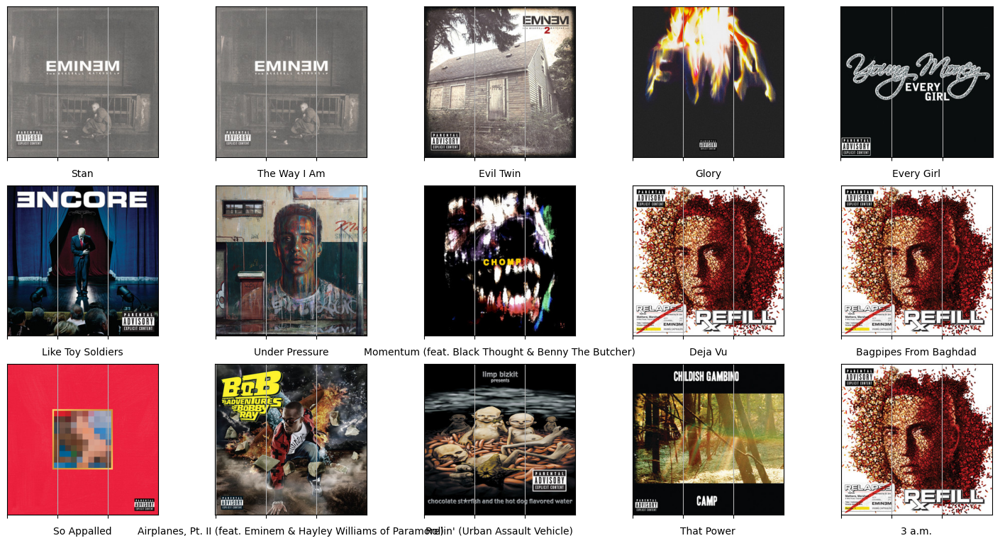

In [ ]:
recomendador("Eminem - Stan")